## MultiAgentAlgo 2

Here's a high-level overview of the Independent Q-Learning algorithm:

Initialize the Q-values for each agent randomly or to some initial values.<br>
Repeat the following steps until convergence or a predefined number of iterations:<br>
a. For each agent:<br>
* Observe the current state of the environment.<br>
* Select an action based on an exploration-exploitation strategy (e.g., epsilon-greedy).<br>
* Execute the action in the environment.<br>
* Receive a reward and the next state.<br>
* Update the agent's Q-value function using the Q-learning update rule:<br>
* Q(s, a) = Q(s, a) + α * (r + γ * max(Q(s', a')) - Q(s, a))<br>
* Update the current state.<br>

b. Update any necessary exploration-exploitation parameters (e.g., epsilon) for each agent.<br>
* Repeat the above steps for a sufficient number of episodes or until convergence.<br>

In [2]:
import sys
sys.path.append('pyFiles')
from MultiAgentEnv2 import CustomEnvironment
import networkx as nx
import pprint
import numpy as np
import matplotlib.pyplot as plt

### Initialize the Q-values for each agent randomly or to some initial values.
> every agent can take 4 actions in a state

no of state for an agent is $13 ^{no of agents}$ as each agent being in a state<br>
is a state for this one agent

In [3]:
no_of_agents = 4
s_values = [0] * 13**no_of_agents
print(len(s_values))

28561


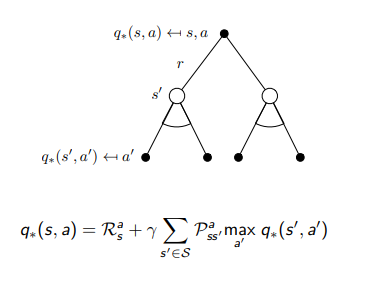

In [4]:
def q_val(env,state,action,s_values,agent):
    env.reset()
    env.state = state
    reward = 0
    observations, rewards, terminations, truncations, infos = env.step(action)
    s_val_index = state_index_calculator(env,observations)
    for agent in env.possible_police:
        reward = rewards[agent]
    return reward + 0.9*s_values[s_val_index]

In [5]:
def s_val(env,state,s_values,agent):
    for thief in env.possible_thieves:
        for police in env.possible_police:
            if state[thief] == state[police]:
                return 0
#     index = state_index_calculator(env,state)
    q_values = []
    for j in range(4):
        for k in range(4):
            for l in range(4):
                temp_state = state.copy()
                action = {env.possible_agents[0]:0,env.possible_agents[1]:j,env.possible_agents[2]:k,env.possible_agents[3]:l}
                q_values.append(q_val(env,temp_state,action,s_values,agent))
    return max(q_values)

def max_act(env,state,s_values,agent):
#     action = {env.possible_agents[0]:0,env.possible_agents[1]:0,env.possible_agents[2]:0,env.possible_agents[3]:0}
    for thief in env.possible_thieves:
        for police in env.possible_police:
            if state[thief] == state[police]:
                return {env.possible_agents[0]:0,env.possible_agents[1]:0,env.possible_agents[2]:0,env.possible_agents[3]:0}
    q_values = []
    actions = []
    for j in range(4):
        for k in range(4):
            for l in range(4):
                temp_state = state.copy()
                action = {env.possible_agents[0]:0,env.possible_agents[1]:j,env.possible_agents[2]:k,env.possible_agents[3]:l}
                q_values.append(q_val(env,temp_state,action,s_values,agent))
                actions.append(action)
    max_val = max(q_values)
    max_val_index = q_values.index(max_val)
    return actions[max_val_index]

def state_index_calculator(env,state):
    multiplier = 1
    state_index = 0
    for agent in env.possible_agents:
        state_index += env.node_inv_dict[state[agent]]* multiplier
        multiplier *= 13
    return state_index


def state_calculator(env,state_index):
    temp_state = {}
    for n in range (4):
        temp_state[env.possible_agents[n]] = env.node_dict[(state_index // (13**(3-n)))]
        state_index = state_index % (13**(3-n))
    return temp_state

In [6]:
env  = CustomEnvironment()
state = env.reset()

print(env.possible_agents[1])

print(state_calculator(env,10))

# print(str(env.node_dict[0]))
# for agent in env.possible_agents:
#     state[agent]= str(env.node_dict[0])
    
# state['thief_0'] = str(env.node_dict[2])    
# state['police_0'] = str(env.node_dict[5])    
# state['police_1'] = str(env.node_dict[1])
# state['police_2'] = str(env.node_dict[0])


# s_val(env,state,s_values,'police_0')

police_0
{'thief_0': '(0.3584447216903549, 0.09709933172300317)', 'police_0': '(0.3584447216903549, 0.09709933172300317)', 'police_1': '(0.3584447216903549, 0.09709933172300317)', 'police_2': '(0.5645777573174426, 0.4985268421861343)'}


In [7]:
def single_sweep(env,s_values,agent):
    temp_value_func = [0] * env.g_no_node ** 4
    for i in range(env.g_no_node**4):
        state= state_calculator(env,i)
        temp_value_func[i] = s_val(env,state,s_values,agent)
    return temp_value_func

In [8]:
# state_calculator(env, 169)
# print(s_values)
s_values = single_sweep(env,s_values,'police_0')

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating st

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating step
tetminating s

In [ ]:

index = range(13**4)

In [ ]:
state = env.reset()
s_values = [0] * env.g_no_node ** 4
delta = 0.1
diff = 1000
count = 0
agent = 'police_0'
while (diff > delta):
    temp_value_func = [v for v in s_values]
    s_values = single_sweep(env,s_values,agent)
    temp_diff = 0;
    for index in range(len(s_values)):
        temp_diff += abs(temp_value_func[index]-s_values[index])
    diff = temp_diff
    plt.plot(range(13**4),s_values)
    plt.show()
print(s_values)
s_values2 = [0] * env.g_no_node ** 4

In [9]:
import seaborn as sns
import numpy as np
x = np.zeros((169,169))

In [10]:
for n in range(len(s_values)):
    i = n // 169
    j = n % 169
    x[i,j] = s_values[n]

In [11]:
x

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ..., -1., -1., -1.],
       [ 0.,  0.,  0., ..., -1., -1., -1.],
       ...,
       [-1., -1., -1., ...,  0.,  0.,  0.],
       [-1., -1., -1., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

<Axes: >

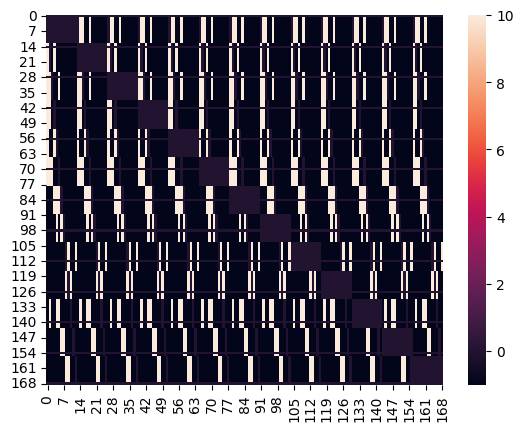

In [12]:
sns.heatmap(x)

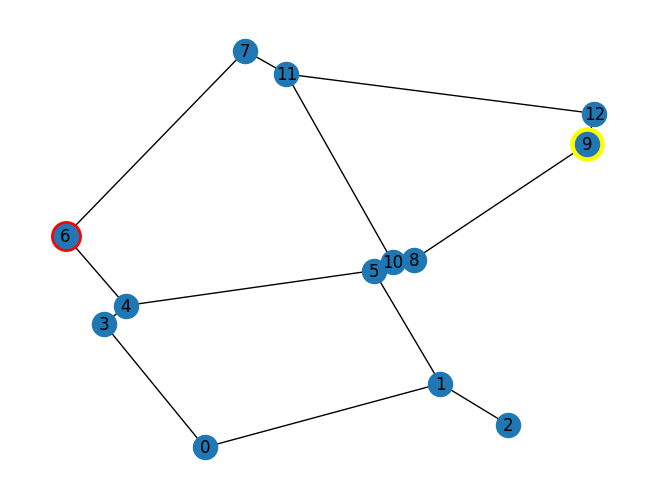

{'thief_0': 0, 'police_0': 0, 'police_1': 2, 'police_2': 2}


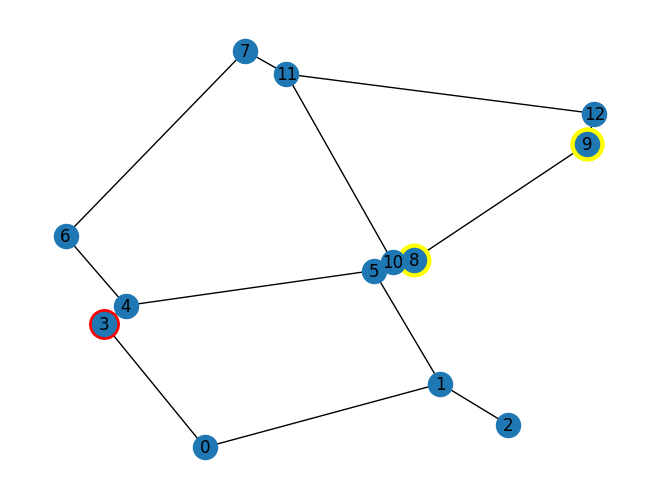

terminating episode = 0
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


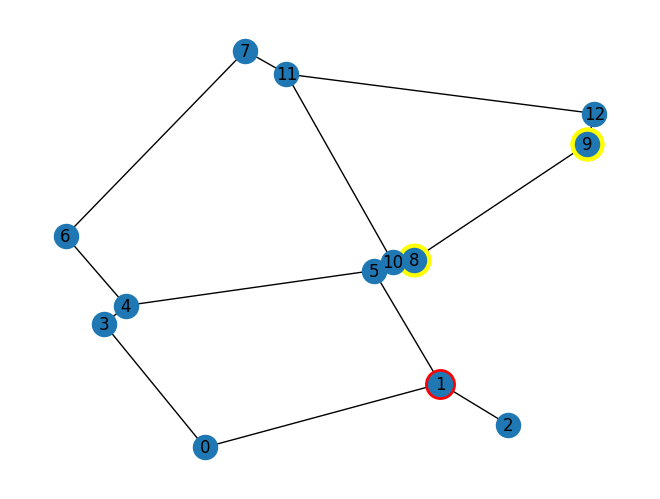

terminating episode = 1
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


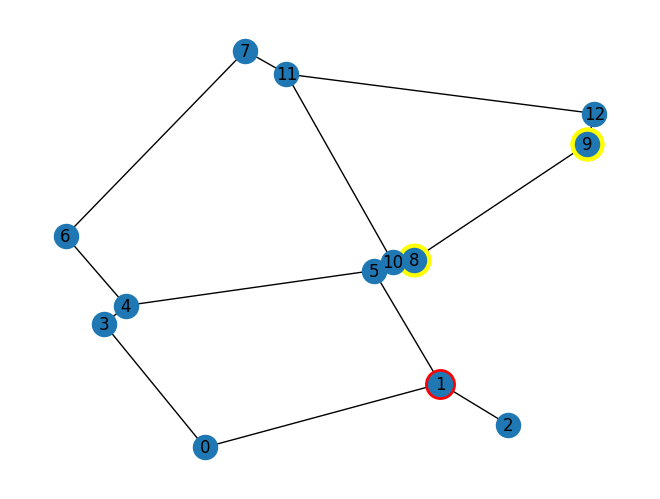

terminating episode = 2
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


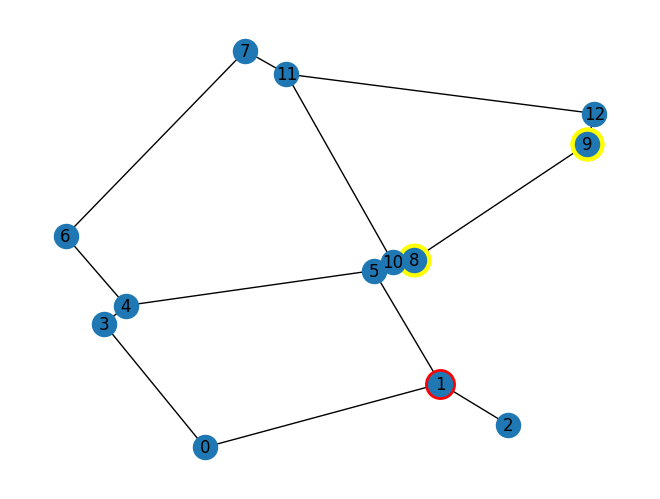

terminating episode = 3
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


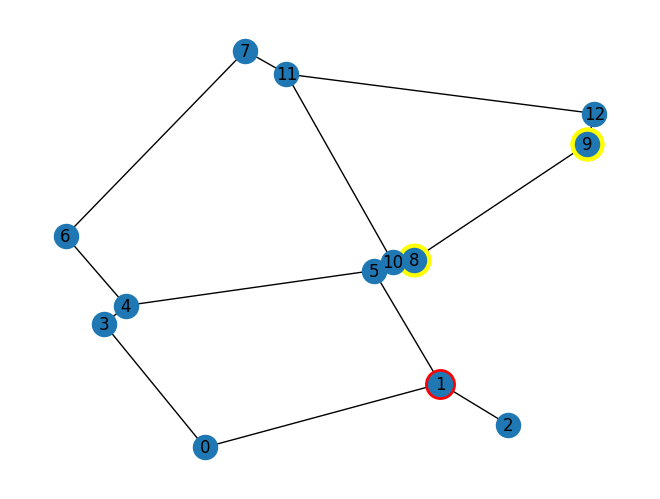

terminating episode = 4
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


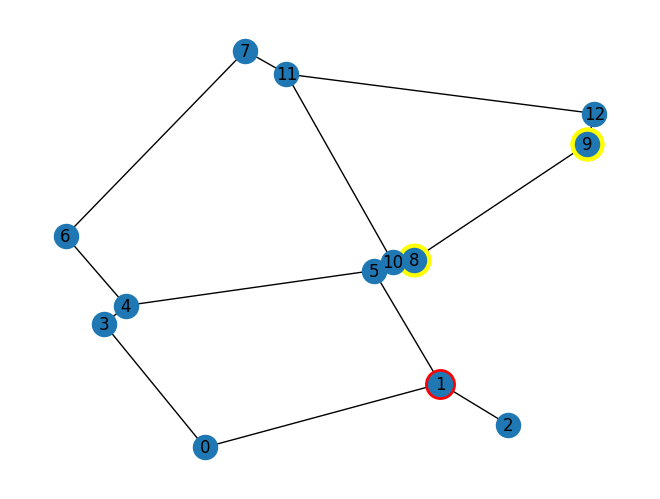

terminating episode = 5
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


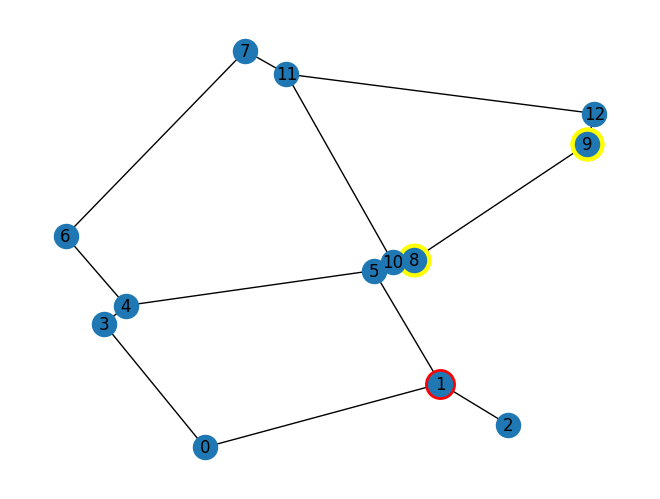

terminating episode = 6
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


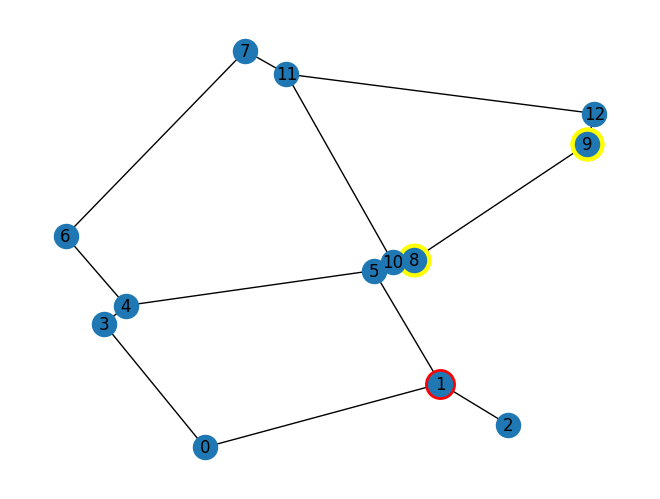

terminating episode = 7
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


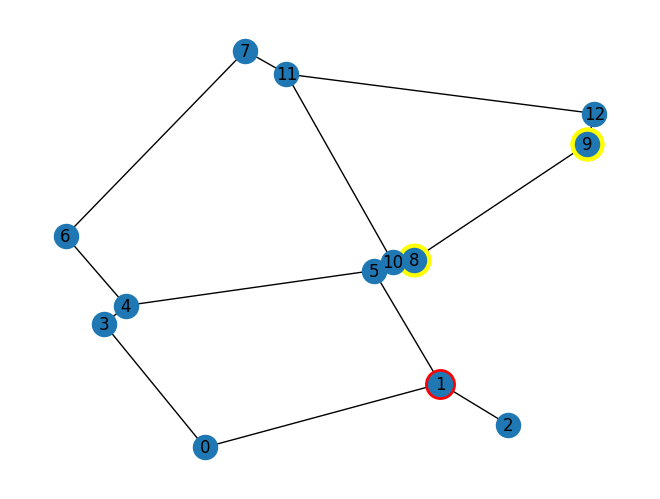

terminating episode = 8
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


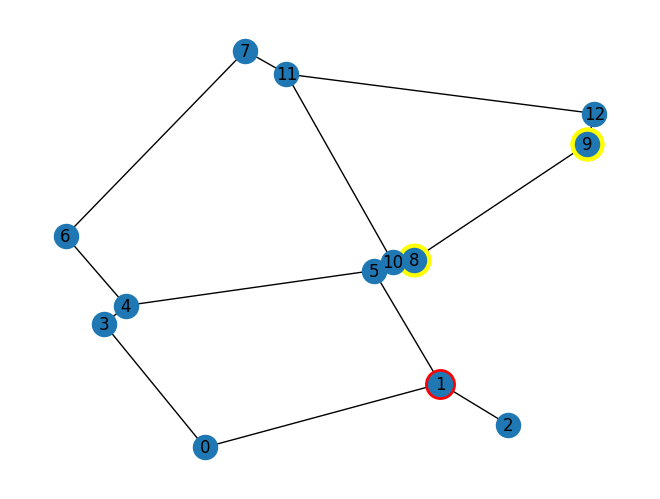

terminating episode = 9
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


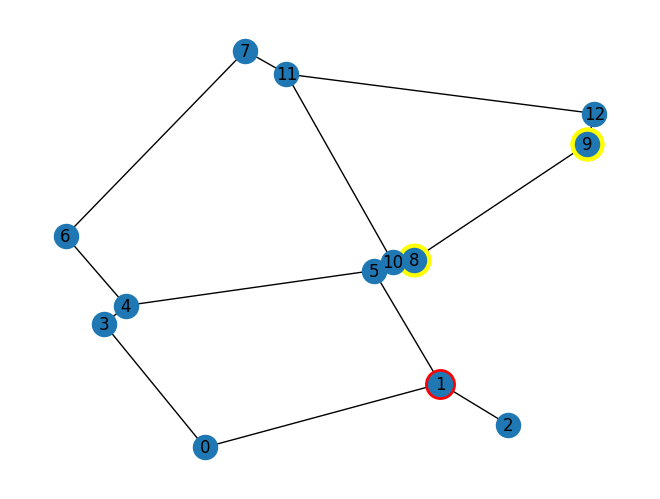

terminating episode = 10
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


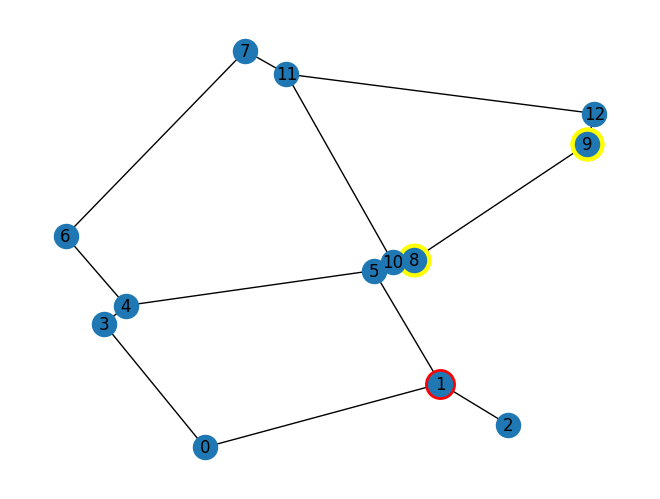

terminating episode = 11
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


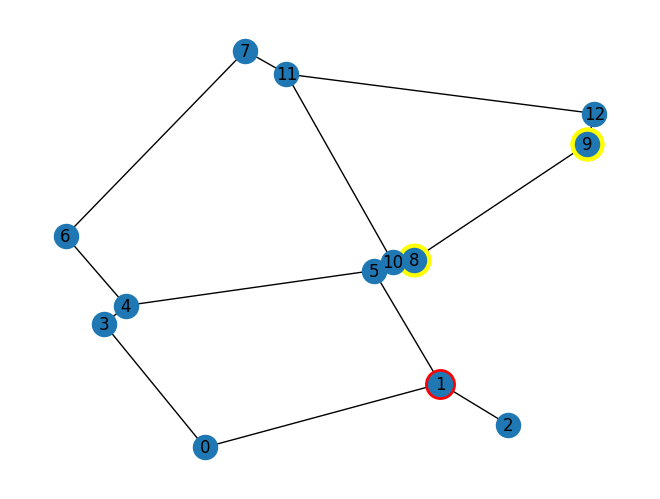

terminating episode = 12
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


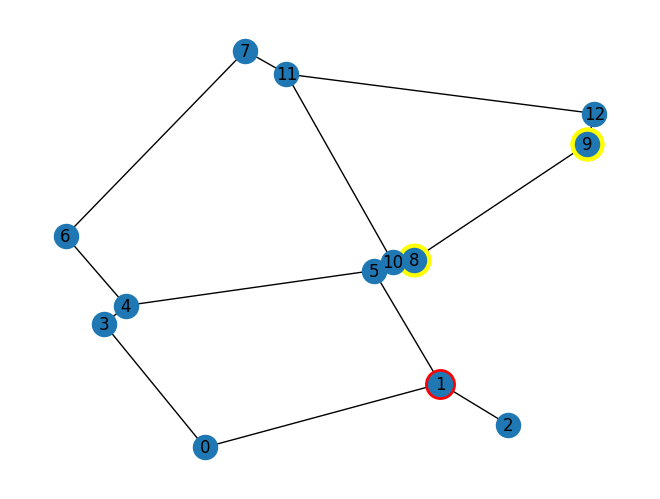

terminating episode = 13
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


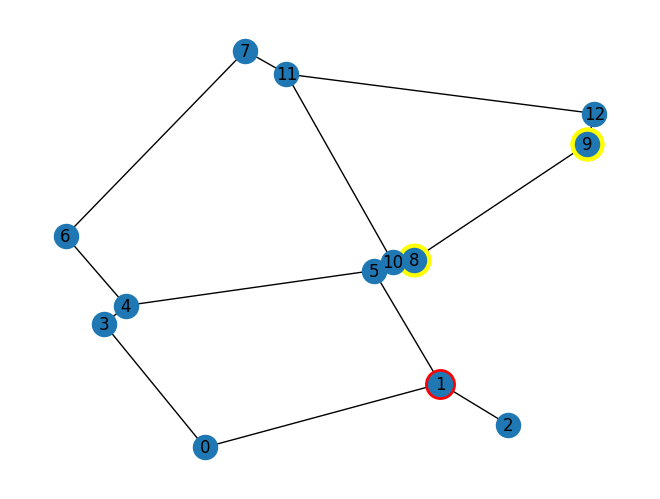

terminating episode = 14
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


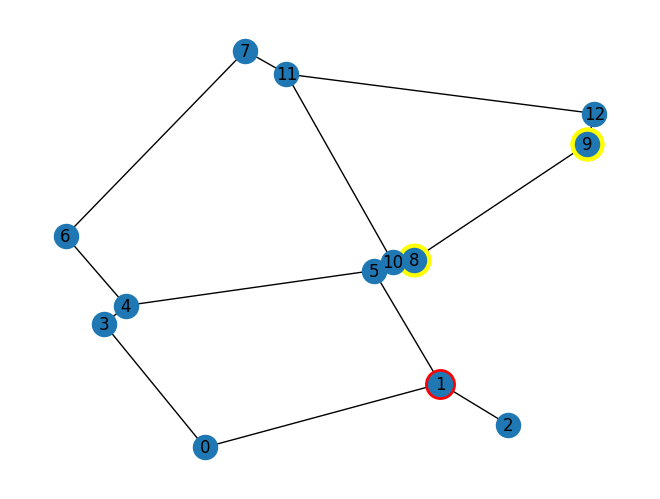

terminating episode = 15
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


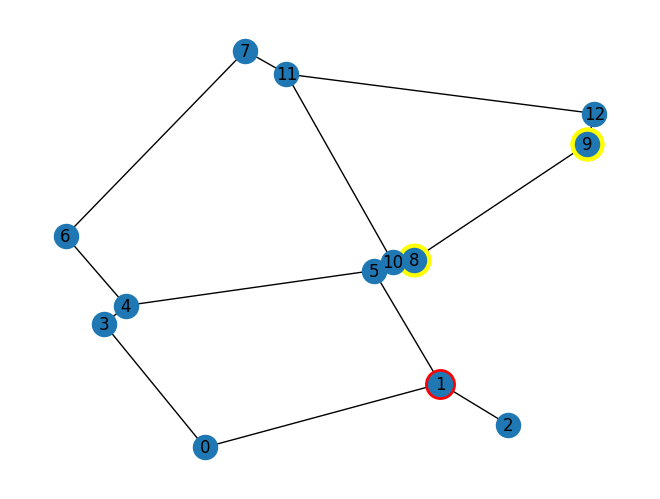

terminating episode = 16
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


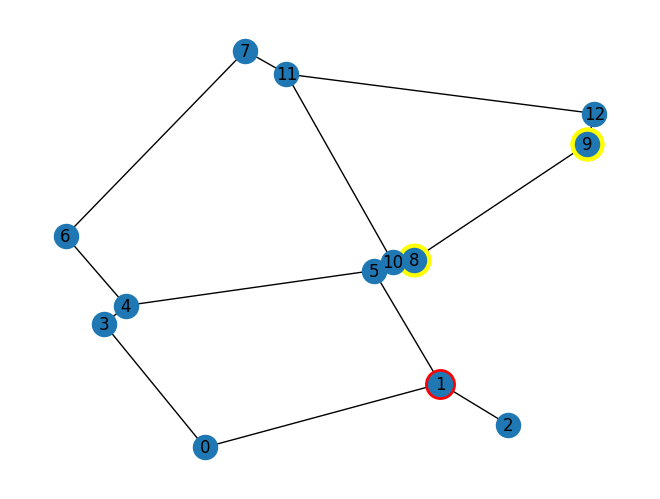

terminating episode = 17
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


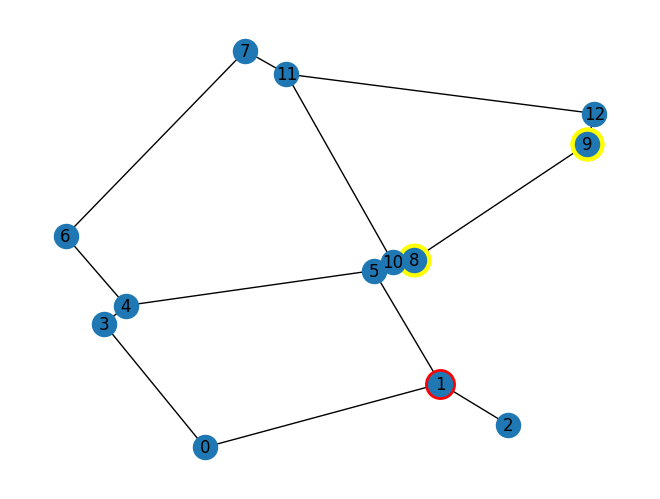

terminating episode = 18
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


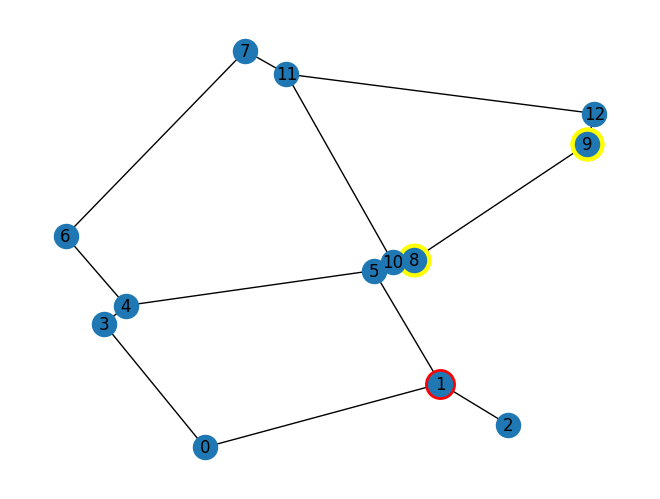

terminating episode = 19
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


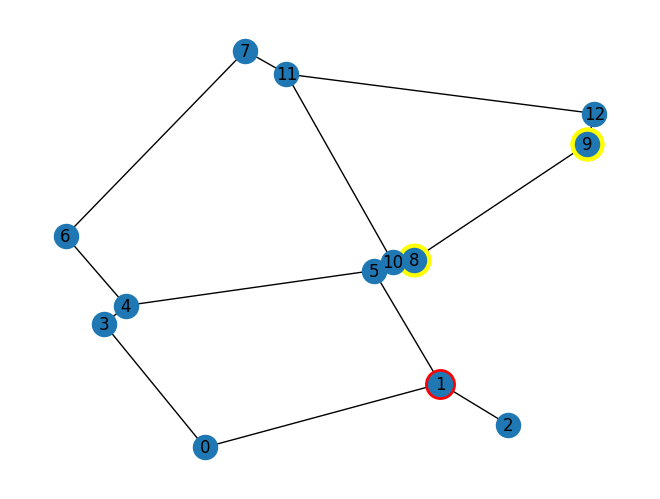

terminating episode = 20
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


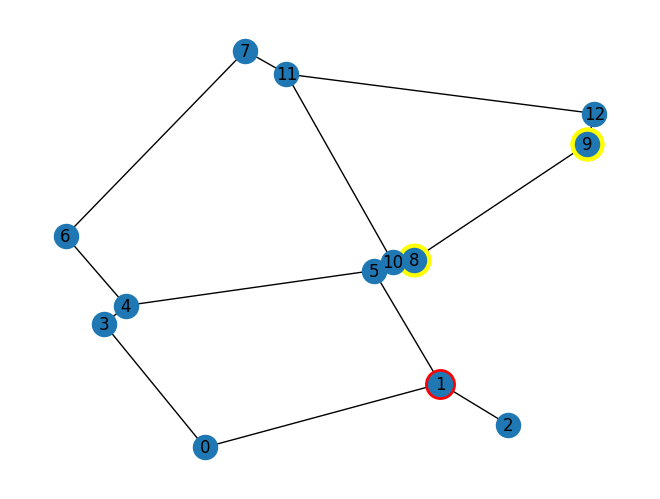

terminating episode = 21
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


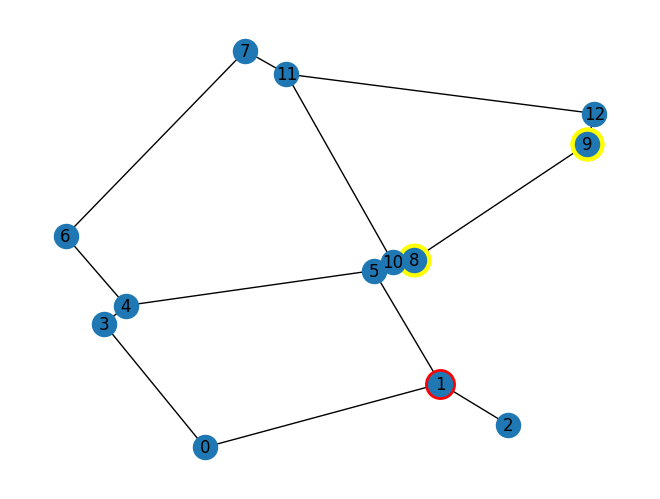

terminating episode = 22
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


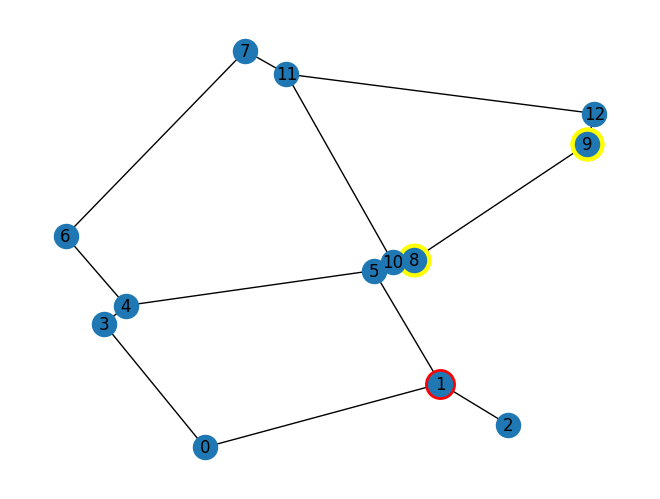

terminating episode = 23
{'thief_0': 0, 'police_0': 0, 'police_1': 0, 'police_2': 2}


KeyboardInterrupt: 

In [13]:
# running game

episodes = 1    
for episode in range(1,episodes+1):
    state = env.reset()
    terminations = {agent:False for agent in env.possible_agents}
    score = {a:0 for a in env.possible_agents}
    count = 0
#     print(state)
    env.temp_render(episode)
    while not terminations['police_1']:
        action = max_act(env,state,s_values,'police_1')
        print(action)
        observations, rewards, terminations, truncations, infos = env.step(action)
        state = observations
        env.temp_render(episode)
        if (terminations[agent] == True for agent in env.possible_agents):
            print('terminating episode = {}'.format(count))
        for agent in env.possible_agents:
            score[agent] += rewards[agent]
        count += 1
    env.temp_render(20)
    print('Episode: {} Score: {} \n'.format(episode,score))

In [ ]:
temp_policy = [0]*(env.g_no_node**4)
agent = 'player_1'
for i in range(env.g_no_node**4):
    agent = 'player_1'
    n1 = np.random.randint(0,env.possible_move_range('player_0')+1)
    action = {'player_0':n1,'player_1':0}
    q_values = []
    thief_position = i // 13
    police_position = i % 13
    state = {'player_0':env.node_dict[thief_position],'player_1':env.node_dict[police_position]}
    action[agent] = -1
    for neighbor in env.g_env.neighbors(env.state[agent]):
        action[agent] += 1
        q_values.append(q_val(env,state,action,value_func,agent))
    max_val = max(q_values)
    req_index = q_values.index(max_val)        
    temp_policy[i] = int(req_index) 

print(temp_policy)
temp_policy = list(temp_policy)

In [ ]:
episodes = 1    
for episode in range(1,episodes+1):
    state = env.reset()
    terminations = {agent:False for agent in env.possible_agents}
    score = {a:0 for a in env.possible_agents}
    count = 0
    print(state)
    while not terminations['player_1']:
#         n0 = np.random.randint(0,env.possible_move_range('player_0')+1)
#         print(n0)
        n0 = 0
        env.temp_render(episode)
        n1 = temp_policy[13*env.node_inv_dict[env.state['player_0']]+env.node_inv_dict[env.state['player_1']]]
        action = {'player_0':n0,'player_1':n1}
        observations, rewards, terminations, truncations, infos = env.step(action)
        if (terminations['player_1'] == True):
            print('terminating episode = {}'.format(count))
        for agent in env.possible_agents:
            score[agent] += rewards[agent]
        count += 1
    env.temp_render(20)
    print('Episode: {} Score: {} \n'.format(episode,score))